#YOLOV5 ON TRASH DATASET

Credits

This notebook is partially based on this https://github.com/pedropro/TACO/blob/master/demo.ipynb and https://github.com/pedropro/TACO/blob/master/detector/detector.ipynb and https://github.com/wimlds-trojmiasto/detect-waste/blob/main/notebooks/EDA_taco.ipynb 

#Dataset visualization

Download the dataset

In [1]:
!gdown --id 1dWNGOoheY46S9jQ3m5LB-dt3KNkXDLzH

/usr/local/lib/python3.9/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1dWNGOoheY46S9jQ3m5LB-dt3KNkXDLzH
To: /content/GARBAGE_DATA-20230331T035204Z-001.zip
100% 706M/706M [00:07<00:00, 90.3MB/s]


unzip the contents

In [2]:
!unzip /content/GARBAGE_DATA-20230331T035204Z-001.zip

Archive:  /content/GARBAGE_DATA-20230331T035204Z-001.zip
  inflating: GARBAGE_DATA/annotations_train.json  
  inflating: GARBAGE_DATA/taco.zip (Unzipped Files)/meta_df.csv  
  inflating: GARBAGE_DATA/taco.zip (Unzipped Files)/kle_log.txt  
   creating: GARBAGE_DATA/taco.zip (Unzipped Files)/data/batch_13/
   creating: GARBAGE_DATA/taco.zip (Unzipped Files)/data/batch_15/
   creating: GARBAGE_DATA/taco.zip (Unzipped Files)/data/batch_7/
   creating: GARBAGE_DATA/taco.zip (Unzipped Files)/data/batch_8/
   creating: GARBAGE_DATA/taco.zip (Unzipped Files)/data/batch_3/
   creating: GARBAGE_DATA/taco.zip (Unzipped Files)/data/batch_9/
   creating: GARBAGE_DATA/taco.zip (Unzipped Files)/data/batch_4/
   creating: GARBAGE_DATA/taco.zip (Unzipped Files)/data/batch_14/
   creating: GARBAGE_DATA/taco.zip (Unzipped Files)/data/batch_2/
   creating: GARBAGE_DATA/taco.zip (Unzipped Files)/data/batch_12/
   creating: GARBAGE_DATA/taco.zip (Unzipped Files)/data/batch_5/
   creating: GARBAGE_DATA/taco

set path to the data and annottations files

In [3]:

%matplotlib inline
import sys
from pathlib import Path
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()


from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

from collections import Counter

module_path = str(Path.cwd().parents[0] / "src")
if module_path not in sys.path:
    sys.path.append(module_path)


dataset_path = '/content/GARBAGE_DATA/taco.zip (Unzipped Files)/data'
anns_file_path = dataset_path + '/' + 'annotations.json'

# Read annotations
with open(anns_file_path, 'r') as f:
    dataset = json.loads(f.read())


print out the number of item in each catagery and super catagery

In [4]:


categories = dataset['categories']
anns = dataset['annotations']
imgs = dataset['images']
nr_cats = len(categories)
nr_annotations = len(anns)
nr_images = len(imgs)

# Load categories and super categories
cat_names = []
super_cat_names = []
super_cat_ids = {}
super_cat_last_name = ''
nr_super_cats = 0
for cat_it in categories:
    cat_names.append(cat_it['name'])
    super_cat_name = cat_it['supercategory']
    # Adding new supercat
    if super_cat_name != super_cat_last_name:
        super_cat_names.append(super_cat_name)
        super_cat_ids[super_cat_name] = nr_super_cats
        super_cat_last_name = super_cat_name
        nr_super_cats += 1

print('Number of super categories:', nr_super_cats)
print('Number of categories:', nr_cats)
print('Number of annotations:', nr_annotations)
print('Number of images:', nr_images)



Number of super categories: 28
Number of categories: 60
Number of annotations: 4784
Number of images: 1500


an example of an annotation in COCO format

In [5]:

anns_to_print = anns[0].pop('segmentation', None) # removing segmentation polygon for better clarity
anns[0]


{'id': 1,
 'image_id': 0,
 'category_id': 6,
 'area': 403954.0,
 'bbox': [517.0, 127.0, 447.0, 1322.0],
 'iscrowd': 0}

plotting the number of annotations per category

<ipython-input-6-79ae10ab5ea3>:11: FutureWarning: In a future version of pandas all arguments of DataFrame.sort_values except for the argument 'by' will be keyword-only.
  df = df.sort_values('Number of annotations', 0, False)


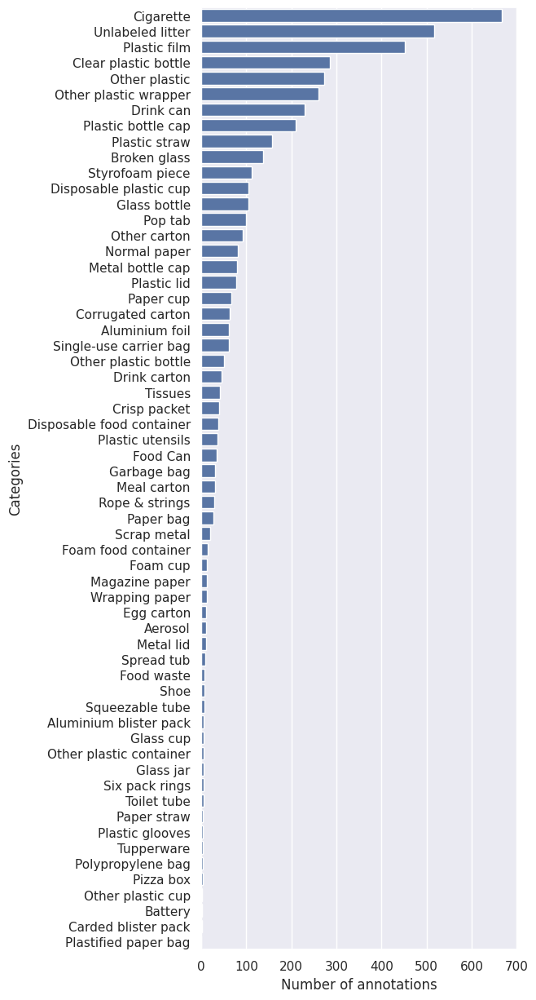

In [6]:

# Count annotations
cat_histogram = np.zeros(nr_cats,dtype=int)
for ann in anns:
    cat_histogram[ann['category_id']] += 1

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,15))

# Convert to DataFrame
df = pd.DataFrame({'Categories': cat_names, 'Number of annotations': cat_histogram})
df = df.sort_values('Number of annotations', 0, False)

# Plot the histogram
sns.set_color_codes("pastel")
sns.set(style="whitegrid")
plot_1 = sns.barplot(x="Number of annotations", y="Categories", data=df,
            label="Total", color="b")


as we can see the first 6 classes are over represented and the rest underrepresented.To tackle this lets convert the tacolabels to detect waste labels with 7 categories


In [7]:



def taco_to_detectwaste(label):
    glass = ['Glass bottle','Broken glass','Glass jar']
    metals_and_plastics = ['Aluminium foil', "Clear plastic bottle","Other plastic bottle",
                         "Plastic bottle cap","Metal bottle cap","Aerosol","Drink can",
                         "Food can","Drink carton","Disposable plastic cup","Other plastic cup",
                         "Plastic lid","Metal lid","Single-use carrier bag","Polypropylene bag",
                         "Plastic Film","Six pack rings","Spread tub","Tupperware",
                         "Disposable food container","Other plastic container",
                         "Plastic glooves","Plastic utensils","Pop tab","Scrap metal",
                         "Plastic straw","Other plastic", "Plastic film", "Food Can"]
    
    non_recyclable = ["Aluminium blister pack","Carded blister pack",
                    "Meal carton","Pizza box","Cigarette","Paper cup",
                    "Meal carton","Foam cup","Glass cup","Wrapping paper",
                    "Magazine paper","Garbage bag","Plastified paper bag",
                    "Crisp packet","Other plastic wrapper","Foam food container",
                    "Rope","Shoe","Squeezable tube","Paper straw","Styrofoam piece", "Rope & strings", "Tissues"]
    
    other = ["Battery"]
    paper = ["Corrugated carton","Egg carton","Toilet tube","Other carton", "Normal paper", "Paper bag"]
    bio = ["Food waste"]
    unknown = ["Unlabeled litter"]

    if (label in glass):
            label="glass"
    elif (label in metals_and_plastics):
            label="metals_and_plastics"
    elif(label in non_recyclable):
            label="non-recyclable"
    elif(label in other):
            label="other"
    elif (label in paper):
            label="paper"
    elif(label in bio):
            label="bio"
    elif(label in unknown):
            label="unknown"
    else:
        print(label, "is non-taco label")
        label = "unknown"
    return label
    

In [8]:

# convert all taco anns to detect-waste anns
# let's change supercategory to detectwaste
detectwaste_categories = dataset['categories']
for ann in anns:
    cat_id = ann['category_id']
    cat_taco = categories[cat_id]['name']
    detectwaste_categories[cat_id]['supercategory'] = taco_to_detectwaste(cat_taco)
# As there is no representation of "Plastified paper bag" in annotated data, change of this supercategory was done manually.
detectwaste_categories[35]['supercategory'] = taco_to_detectwaste("Plastified paper bag")
detectwaste_categories

[{'supercategory': 'metals_and_plastics', 'id': 0, 'name': 'Aluminium foil'},
 {'supercategory': 'other', 'id': 1, 'name': 'Battery'},
 {'supercategory': 'non-recyclable',
  'id': 2,
  'name': 'Aluminium blister pack'},
 {'supercategory': 'non-recyclable', 'id': 3, 'name': 'Carded blister pack'},
 {'supercategory': 'metals_and_plastics',
  'id': 4,
  'name': 'Other plastic bottle'},
 {'supercategory': 'metals_and_plastics',
  'id': 5,
  'name': 'Clear plastic bottle'},
 {'supercategory': 'glass', 'id': 6, 'name': 'Glass bottle'},
 {'supercategory': 'metals_and_plastics',
  'id': 7,
  'name': 'Plastic bottle cap'},
 {'supercategory': 'metals_and_plastics', 'id': 8, 'name': 'Metal bottle cap'},
 {'supercategory': 'glass', 'id': 9, 'name': 'Broken glass'},
 {'supercategory': 'metals_and_plastics', 'id': 10, 'name': 'Food Can'},
 {'supercategory': 'metals_and_plastics', 'id': 11, 'name': 'Aerosol'},
 {'supercategory': 'metals_and_plastics', 'id': 12, 'name': 'Drink can'},
 {'supercategory'

In [9]:

detectwaste_ids = {}
detectwaste_cat_names = []
cat_id = 0
for cat in detectwaste_categories:
    if cat['supercategory'] not in detectwaste_ids:
        detectwaste_cat_names.append(cat['supercategory'])
        detectwaste_ids[cat['supercategory']] = cat_id
        cat_id += 1
        
print(detectwaste_ids)
print(detectwaste_cat_names)

taco_to_detectwaste_ids = {}
for i, cat in enumerate(detectwaste_categories):
#     if cat['id'] not in taco_to_detectwaste_ids:
#         taco_to_detectwaste_ids[cat['id']] = 0
    taco_to_detectwaste_ids[cat['id']] = detectwaste_ids[cat['supercategory']]
    
# print(taco_to_detectwaste_ids)

colors_recykling = ['yellow', 'gray', 'gray', 'green', 'blue', 'brown', 'pink']

anns_detectwaste = anns.copy()
for i, ann in enumerate(anns):
    #print(ann['category_id'])
    anns_detectwaste[i]['category_id'] = taco_to_detectwaste_ids[ann['category_id']]
    anns_detectwaste[i].pop('segmentation', None)
  

{'metals_and_plastics': 0, 'other': 1, 'non-recyclable': 2, 'glass': 3, 'paper': 4, 'bio': 5, 'unknown': 6}
['metals_and_plastics', 'other', 'non-recyclable', 'glass', 'paper', 'bio', 'unknown']


Plotting the annotations per class for the detect waste category

<ipython-input-10-d724f8f635a4>:15: FutureWarning: In a future version of pandas all arguments of DataFrame.sort_values except for the argument 'by' will be keyword-only.
  df = df.sort_values('Number of annotations', 0, False)


Text(0.5, 1.0, 'Annotations per detectwaste category')

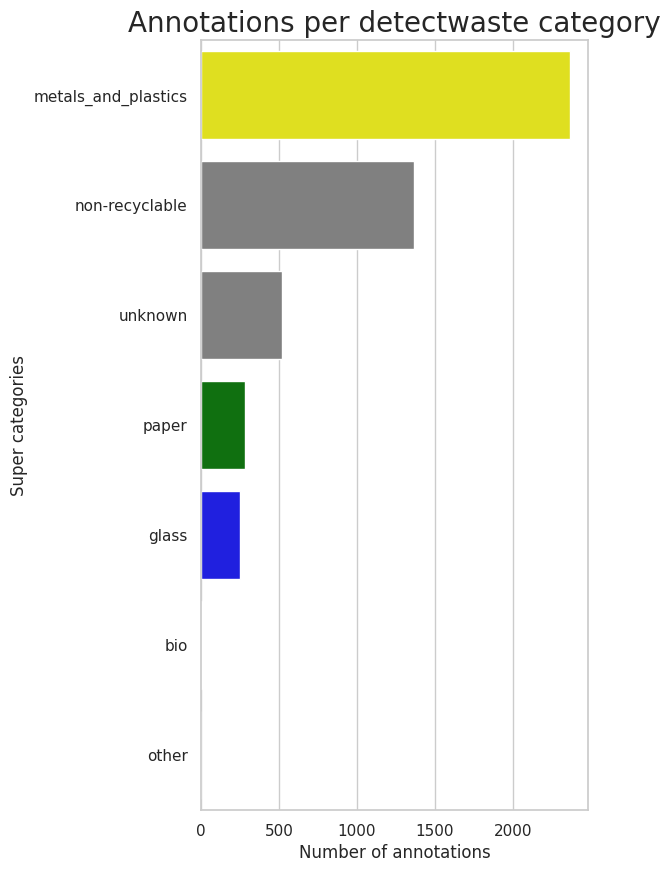

In [10]:


# Count annotations
detectwaste_cat_histogram = np.zeros(len(detectwaste_cat_names),dtype=int)

for ann in anns_detectwaste:
    cat_id = ann['category_id']
    detectwaste_cat_histogram[cat_id] +=1
    

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,10))

# Convert to DataFrame
d ={'Super categories': detectwaste_cat_names, 'Number of annotations': detectwaste_cat_histogram}
df = pd.DataFrame(d)
df = df.sort_values('Number of annotations', 0, False)


sns.set_palette(sns.color_palette(colors_recykling))
plot_1 = sns.barplot(x="Number of annotations", y="Super categories", data=df,
            label="Total")
plot_1.set_title('Annotations per detectwaste category',fontsize=20)
 

as we can see bio glass and other are still underrepresented categories while metals and plastic is overrepresented

##2. Visualize Annotated Images

For simplicity, to select and show the dataset images with the respective masks, we make use of the COCO API. The script below shows how to load and visualize an image with all its annotations.

Unfortunately, several python libraries do not take into account the EXIF orientation tag, thus we have to explicitly rotate the images. Alternatively you can use instead OpenCV.

The script below shows how to filter images by either category or supercategory.

Go ahead and try different (super)categories searches by changing the category_name. Note that small objects may be hard to see

In [11]:

def extract_detectwaste_color(ann, taco_to_detectwaste_ids, colors_recykling):
    color_id = taco_to_detectwaste_ids[ann['category_id']]
    color = colors_recykling[color_id]
    return color
    

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
batch_11/000028.jpg


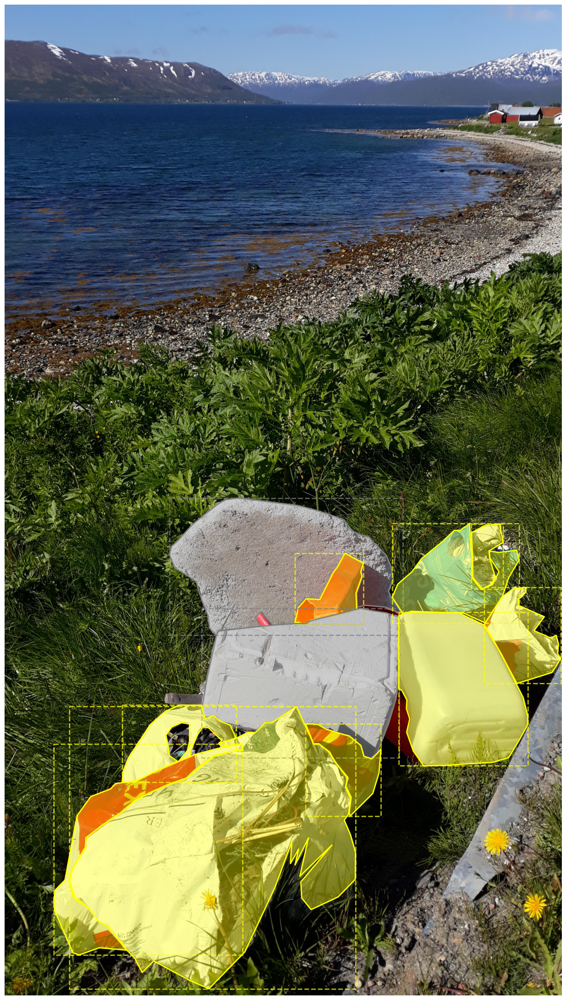

In [98]:


# User settings
image_filepath = 'batch_11/000028.jpg'
pylab.rcParams['figure.figsize'] = (28,28)
####################
imgs = dataset['images']

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Find image id
img_id = -1
for img in imgs:
    if img['file_name'] == image_filepath:
        img_id = img['id']
        break

# Show image and corresponding annotations
if img_id == -1:
    print('Incorrect file name')
else:

    # Load image
    print(image_filepath)
    I = Image.open(dataset_path + '/' + image_filepath)

    # Load and process image metadata
    if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)

    # Show image
    fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(I)

    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img_id, catIds=[], iscrowd=None)
    anns_sel = coco.loadAnns(annIds)

    # Show annotations
    for ann in anns_sel:
        color = extract_detectwaste_color(ann, taco_to_detectwaste_ids, colors_recykling)
        for seg in ann['segmentation']:
            poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox']
        rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)

    plt.show()
  

##Install yolov5 

In [12]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install pycocotools -qr requirements.txt  # install dependencies

import torch
from IPython.display import Image, clear_output  # to display images
clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.13.1+cu116 _CudaDeviceProperties(name='NVIDIA A100-SXM4-40GB', major=8, minor=0, total_memory=40513MB, multi_processor_count=108)


##Download  the best weights for detection

In [13]:
!pip install --upgrade --no-cache-dir gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.6.6
    Uninstalling gdown-4.6.6:
      Successfully uninstalled gdown-4.6.6


In [14]:
!gdown --id 1Vb9kSTM7S84I-BDonUN1IUSvhObcOZqv

/usr/local/lib/python3.9/dist-packages/gdown/cli.py:126: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1Vb9kSTM7S84I-BDonUN1IUSvhObcOZqv
To: /content/yolov5/BESTWEIGHTS.pt
100% 14.4M/14.4M [00:00<00:00, 19.5MB/s]


##Download the dataset from roboflow


I have applied the following preprocessing and augmentation steps to the data

PREPROCESSING-

Auto-Orient: Applied

Isolate Objects: Applied

Resize: Stretch to 640x640

Modify Classes: 2 remapped, 2 dropped-to overcome the imbalanced dataset problem I dropped out two classes that were severely under represented ie bio and other and regrouped paper and bio into one class-recyclable and dropped out glass.Now we have 4 classes-metals and plastic,no recycylable,recyclable and unknown


AUGMENTATIONS


Outputs per training example: 3

Crop: 0% Minimum Zoom, 33% Maximum Zoom

Rotation: Between -15° and +15°

Saturation: Between -25% and +25%

Exposure: Between -7% and +7%

Cutout: 3 boxes with 10% size each

The final dataset has 9.9k training set images,542 val set images and 366 test set images

In [15]:
!pip install roboflow

from roboflow import Roboflow 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.7/55.7 KB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 KB 10.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9676 sha256=96cfd1096c3b768173ac422c65fa1514eeb591c74f48e08b7f1fedd0233fcf5a
  Stored in directory: /root/.cache/pip/wheels/04/5f/3e/46cc37c5d698415694d83f607f833f83f0149e49b3af9d0f38
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: idna
    Found existing installation: idna 3.4
    Uninstalling idna-3.4:
   

In [53]:
#!pip install wandb

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


##Train 

train for 100 epochs with batch size 8 .Produced better results than batch size 16 see attatched reports for comapritive results

In [54]:
#!python train.py  --batch-size 8  --epochs 100 --data /content/yolov5/dumpster-4/data.yaml  --cfg /content/yolov5/models/yolov5s.yaml --weights '' 

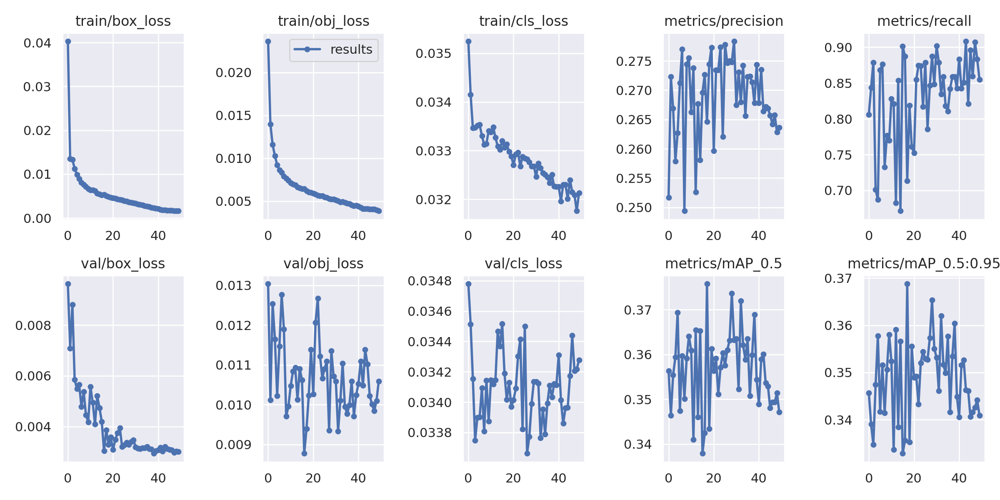

In [82]:
#Image('/content/yolov5/wandb/run-20230401_092500-fuoa0hpa/files/media/images/Results_50_c157abc54d259a375487.png',width=400)

#Validation results

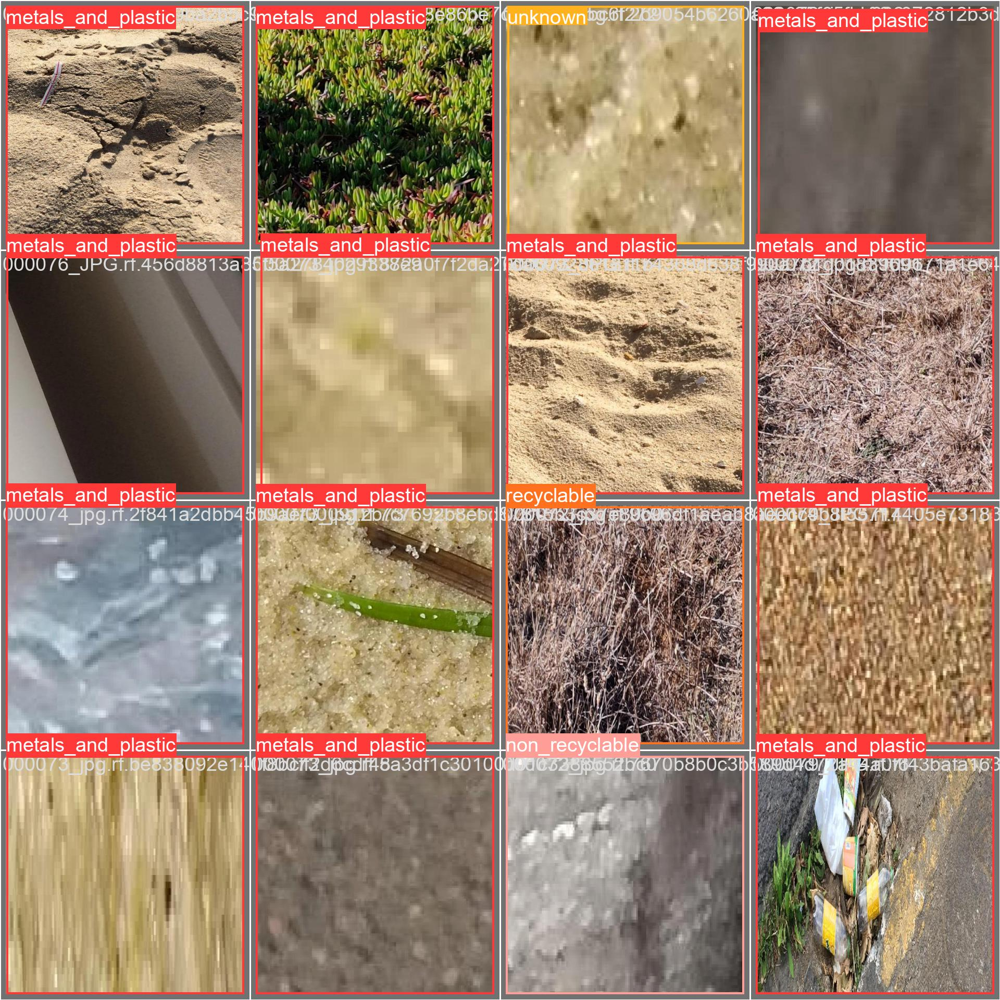

In [79]:
#Image('/content/yolov5/wandb/latest-run/files/media/images/Validation_50_aebecb73877b6f6d40ab.jpg',width=400)

##Hyperparameter evolution using genetic algorithm

fine tuning the model using hyper parameter evolution.

In [59]:
#!python train.py  --batch-size 16  --epochs 10 --evolve --data /content/yolov5/dumpster-4/data.yaml  --cfg /content/yolov5/models/yolov5s.yaml --weights /content/yolov5/BESTWEIGTHSLATEST31032022.pt

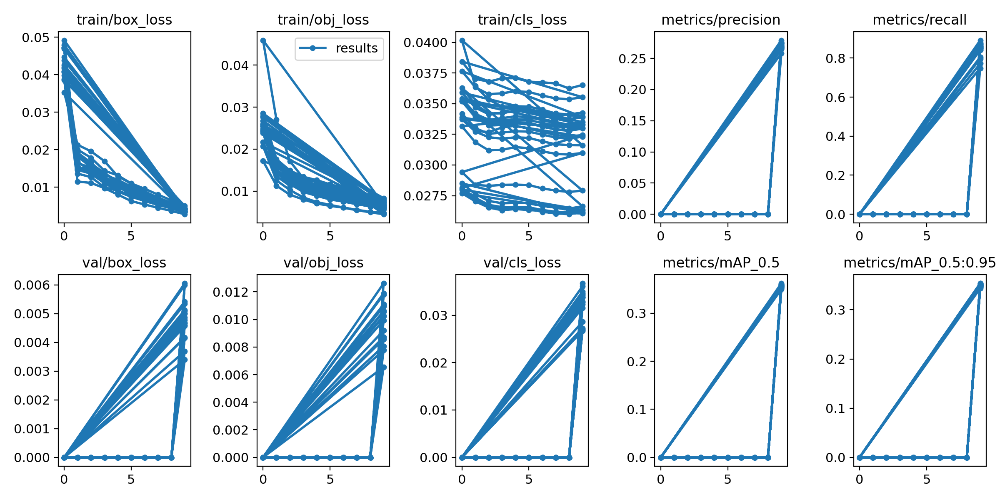

In [72]:
#Image('/content/yolov5/runs/evolve/exp/results.png')

##Training the model with the new hyperparameters

In [61]:
#!python train.py  --batch-size 8  --epochs 50  --data /content/yolov5/dumpster-4/data.yaml  --cfg /content/yolov5/models/yolov5s.yaml --weights /content/yolov5/BESTWEIGTHSLATEST31032022.pt  --hyp /content/yolov5/runs/evolve/exp/hyp_evolve.yaml

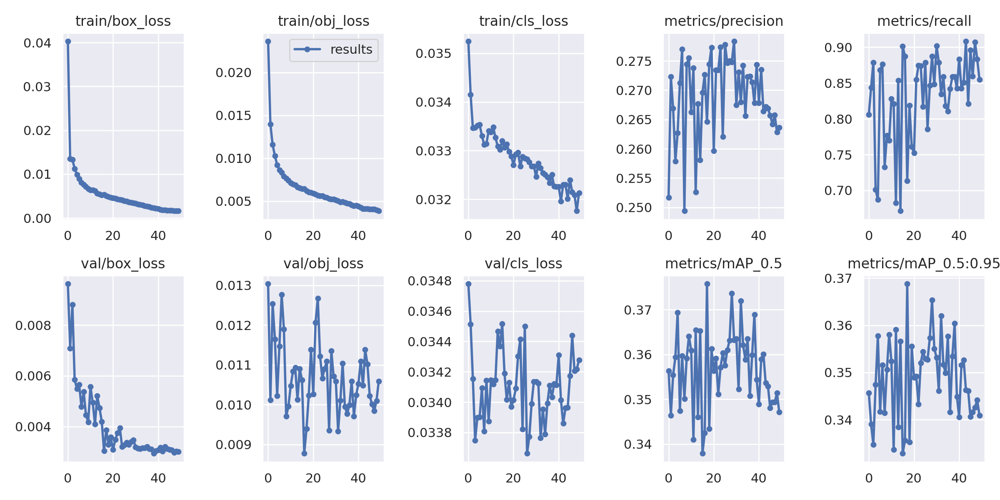

In [73]:
#Image('/content/yolov5/runs/train/exp/results.png',width=800)

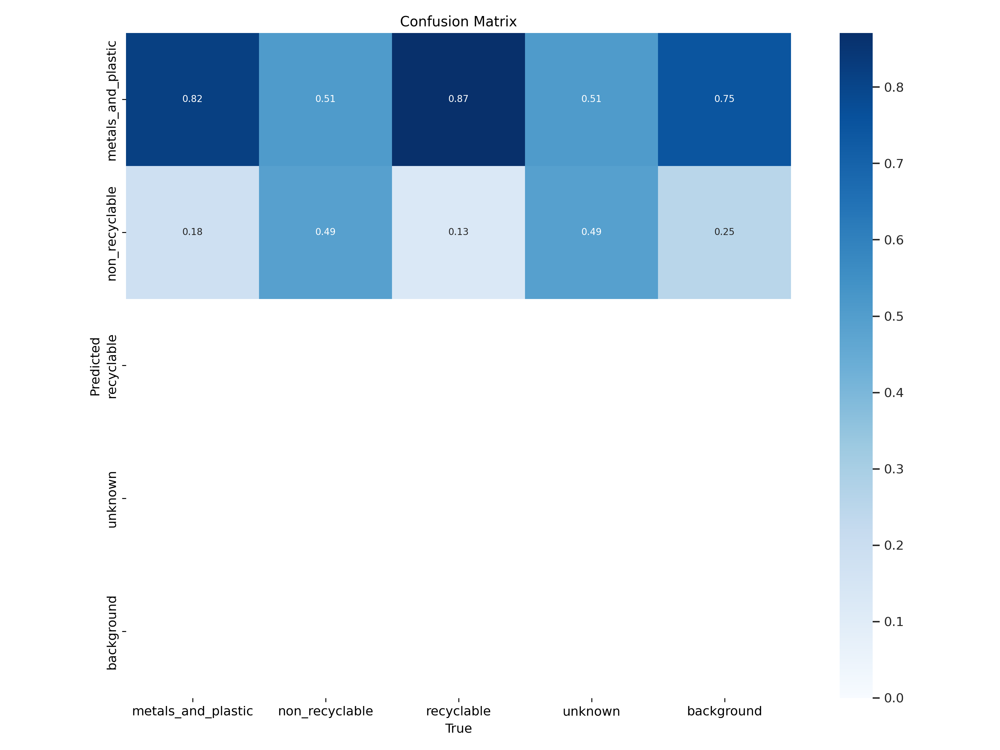

In [74]:
#Image('/content/yolov5/runs/train/exp/confusion_matrix.png',width=400)

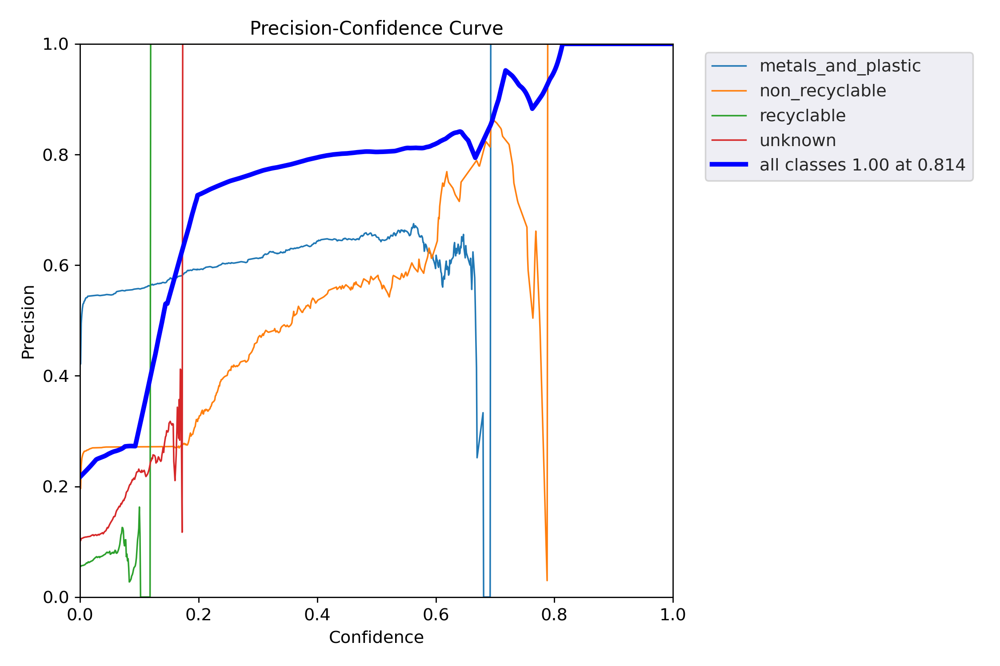

In [76]:
#Image('/content/yolov5/wandb/latest-run/files/media/images/Results_50_5d19c4637863a14cad20.png',width=400)

##Perform detection with new weights

In [65]:
#!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --conf 0.4 --source /content/yolov5/dumpster-4/test/images

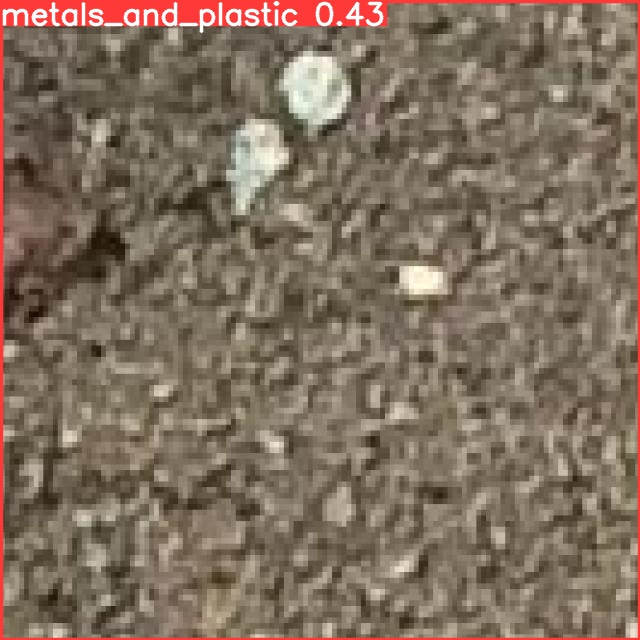

In [77]:
#Image('/content/yolov5/runs/detect/exp3/000009_jpg.rf.af50016795155a4df8c20625fe596c76.jpg',width=300)

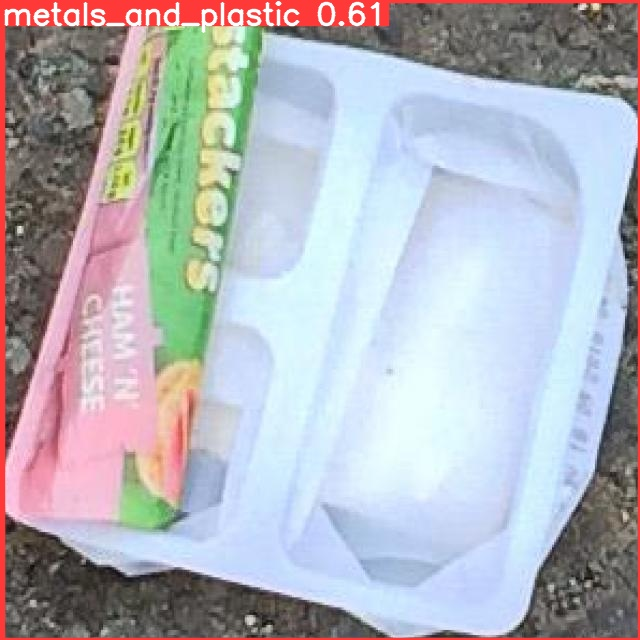

In [78]:
#Image('/content/yolov5/runs/detect/exp3/IMG_4911_JPG.rf.98a509c77b22c7f7d23cdbd1f9e2cbaf.jpg',width=300)

##Test with your own images

Go ahead and detect on your test images .Uncomment tthe following line and add path your dataset 

First upload from google drive the file or folder of test images

In [17]:
#!gdown --id 1xwFl-RjlfGvQuS7xQf4bUIlT2lF7MXU6

/usr/local/lib/python3.9/dist-packages/gdown/cli.py:126: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1xwFl-RjlfGvQuS7xQf4bUIlT2lF7MXU6
To: /content/yolov5/testimage.jpeg
100% 7.82k/7.82k [00:00<00:00, 15.1MB/s]


In [18]:
#!python detect.py --weights /content/yolov5/BESTWEIGHTS.pt --conf 0.4 --source  /path/to/test/images
#for example
#!python detect.py --weights /content/yolov5/BESTWEIGHTS.pt --conf 0.4 --source  /content/yolov5/testimage.jpeg

detect: weights=['/content/yolov5/BESTWEIGHTS.pt'], source=/content/yolov5/testimage.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-133-gcca5e21 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/testimage.jpeg: 480x640 1 metals_and_plastic, 18.7ms
Speed: 0.7ms pre-process, 18.7ms inference, 32.7ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


Display detected images

Usually  the detected images are in/content/yolov5/runs/detect/exp/image

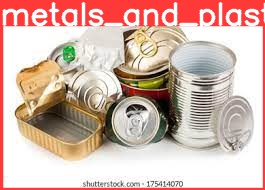

In [19]:
#Image('path/to/detected/images')
#for example
#Image('/content/yolov5/runs/detect/exp/testimage.jpeg')